<a href="https://colab.research.google.com/github/1948023/Semantic-Segmentation-LABIAGI/blob/main/Semantic_Segmentation_v2_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [71]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from tqdm.notebook import tqdm
from random import shuffle
import torch
from torch import nn
import math
from glob import glob
import sys
import shutil

import albumentations as A  

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


%matplotlib inline

In [72]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# data loader

In [73]:
PATH = "/content/drive/MyDrive/Dataset/"

In [74]:
import os
import numpy as np
import torch
import torch.utils.data
import torchvision.transforms as transforms
import PIL
import random
from scipy import ndimage


class segDataset(torch.utils.data.Dataset):
    def __init__(self, root, training, transform=None):
        super(segDataset, self).__init__()
        self.root = root
        self.training = training
        self.transform = transform
        self.IMG_NAMES = sorted(glob(os.path.join(PATH, "img/*")))
        self.RGB_classes = {'Powerline' : [ 255, 255, 125],
                            'Low vegetation' : [0,  255, 255],
                            'Impervious surfaces' : [255, 255, 255],
                            'Car' : [255,  255,  0], 
                            'Fence/Hedge' : [ 0, 255, 125],
                            'Roof' : [0, 0, 255],
                            'Facade' : [0, 125, 255],
                            'Shrub' : [125, 255, 0],
                            'Tree' : [0, 255, 0]}  

        #self.bin_classes = ['Powerline', 'Low vegetation', 'Impervious surfaces', 'Car', 'Fence/Hedge', 'Roof', 'Facade', 'Shrub', 'Tree']


    def __getitem__(self, idx):
        img_path = self.IMG_NAMES[idx]
        mask_path = img_path.replace('img', 'mask')

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path)
        mask = cv2.cvtColor(mask, cv2.COLOR_BGR2RGB)
        #plt.imshow(image)
        plt.imshow(mask)
        #plt.imshow(mask, alpha=0.6)
        cls_mask = np.zeros((mask.shape[0],mask.shape[1]))  
        #print(cls_mask.shape)
        #print((mask == self.RGB_classes['Powerline']).all(axis=2))
        cls_mask[(mask == self.RGB_classes['Powerline']).all(axis=2)] = 0
        cls_mask[(mask == self.RGB_classes['Low vegetation']).all(axis=2)] = 1
        cls_mask[(mask == self.RGB_classes['Impervious surfaces']).all(axis=2)] = 2
        cls_mask[(mask == self.RGB_classes['Car']).all(axis=2)] = 3
        cls_mask[(mask == self.RGB_classes['Fence/Hedge']).all(axis=2)] = 4
        cls_mask[(mask == self.RGB_classes['Roof']).all(axis=2)] = 5
        cls_mask[(mask == self.RGB_classes['Facade']).all(axis=2)] = 6
        cls_mask[(mask == self.RGB_classes['Shrub']).all(axis=2)] = 7
        cls_mask[(mask == self.RGB_classes['Tree']).all(axis=2)] = 8
        #cls_mask = cls_mask[:,:,0] 
        
        if self.training==True:
            if self.transform:
              image = transforms.functional.to_pil_image(image)
              image = self.transform(image)
              image = np.array(image)
              
            # 90 degree rotation
            if np.random.rand()<0.5:
              angle = np.random.randint(4) * 90
              image = ndimage.rotate(image,angle,reshape=True)
              cls_mask = ndimage.rotate(cls_mask,angle,reshape=True)

            # vertical flip
            if np.random.rand()<0.5:
              image = np.flip(image, 0)
              cls_mask = np.flip(cls_mask, 0)
            
            # horizonal flip
            if np.random.rand()<0.5:
              image = np.flip(image, 1)
              cls_mask = np.flip(cls_mask, 1)
        
        image = cv2.resize(image, (512,512))/255.0
        cls_mask = cv2.resize(cls_mask, (512,512)) 
        image = np.moveaxis(image, -1, 0)
        
        return torch.tensor(image).float(), torch.tensor(cls_mask, dtype=torch.int64)


    def __len__(self):
        return len(self.IMG_NAMES)

In [75]:
dataset = segDataset('./Semantic segmentation dataset', training = True)

len(dataset)

459

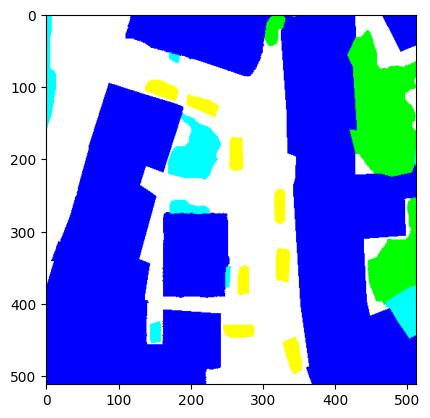

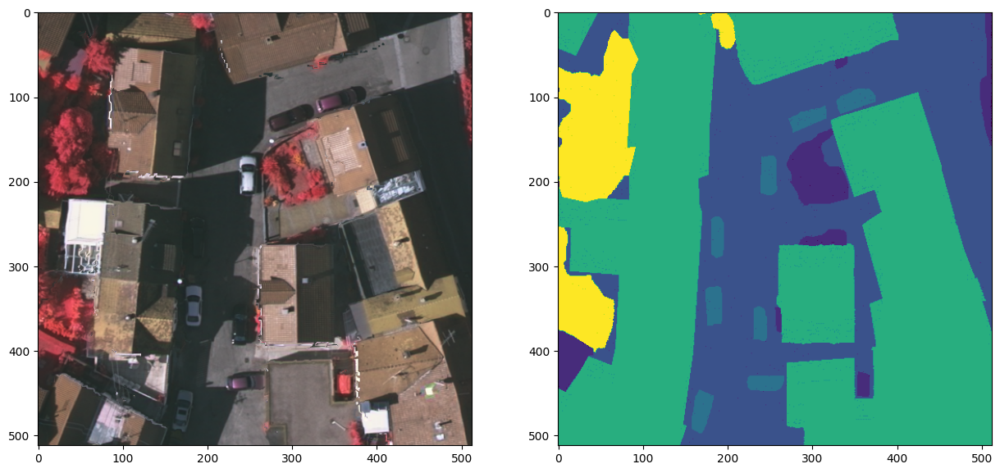

In [76]:
d = dataset[2]
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(np.moveaxis(d[0].numpy(),0,-1))
plt.subplot(1,2,2)
plt.imshow(d[1].numpy())

In [77]:
test_num = int(0.1 * len(dataset))
print(f'test data : {test_num}')
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [len(dataset)-test_num, test_num], generator=torch.Generator().manual_seed(101))

test data : 45


In [78]:
BACH_SIZE = 4
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BACH_SIZE, shuffle=True, num_workers=4)

test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=BACH_SIZE, shuffle=False, num_workers=1)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


# U-net model

In [79]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        # if you have padding issues, see
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

In [80]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

# loss

In [81]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable

class FocalLoss(nn.Module):
    def __init__(self, gamma=0, alpha=None, size_average=True):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        if isinstance(alpha,(float,int)): self.alpha = torch.Tensor([alpha,1-alpha])
        if isinstance(alpha,list): self.alpha = torch.Tensor(alpha)
        self.size_average = size_average

    def forward(self, input, target):
        if input.dim()>2:
            input = input.view(input.size(0),input.size(1),-1)  # N,C,H,W => N,C,H*W
            input = input.transpose(1,2)    # N,C,H*W => N,H*W,C
            input = input.contiguous().view(-1,input.size(2))   # N,H*W,C => N*H*W,C
        target = target.view(-1,1)

        logpt = F.log_softmax(input, dim=-1)
        logpt = logpt.gather(1,target)
        logpt = logpt.view(-1)
        pt = Variable(logpt.data.exp())

        if self.alpha is not None:
            if self.alpha.type()!=input.data.type():
                self.alpha = self.alpha.type_as(input.data)
            at = self.alpha.gather(0,target.data.view(-1))
            logpt = logpt * Variable(at)

        loss = -1 * (1-pt)**self.gamma * logpt
        if self.size_average: return loss.mean()
        else: return loss.sum()

In [82]:
criterion = FocalLoss(gamma=3/4).to(device)

# Jaccard loss

In [83]:
#class mIoULoss(nn.Module):
#    def __init__(self, weight=None, size_average=True, n_classes=9):
#        super(mIoULoss, self).__init__()
#        self.classes = n_classes

#    def to_one_hot(self, tensor):
#        n,h,w = tensor.size()
#        one_hot = torch.zeros(n,self.classes,h,w).to(tensor.device).scatter_(1,tensor.view(n,1,h,w),1)
#        return one_hot

#    def forward(self, inputs, target):
#        # inputs => N x Classes x H x W
#        # target_oneHot => N x Classes x H x W

#        N = inputs.size()[0]

#        # predicted probabilities for each pixel along channel
#        inputs = F.softmax(inputs,dim=1)
        
#        # Numerator Product
#        target_oneHot = self.to_one_hot(target)
#        inter = inputs * target_oneHot
#        ## Sum over all pixels N x C x H x W => N x C
#        inter = inter.view(N,self.classes,-1).sum(2)

#        #Denominator 
#        union= inputs + target_oneHot - (inputs*target_oneHot)
#        ## Sum over all pixels N x C x H x W => N x C
#        union = union.view(N,self.classes,-1).sum(2)

#        loss = inter/union

#        ## Return average loss over classes and batch
#        return 1-loss.mean()

In [84]:
#criterion = mIoULoss(n_classes=9).to(device)

# training

In [85]:
def acc(label, predicted):
  seg_acc = (y.cpu() == torch.argmax(pred_mask, axis=1).cpu()).sum() / torch.numel(y.cpu())
  return seg_acc

In [86]:
min_loss = torch.tensor(float('inf'))

model = UNet(n_channels=3, n_classes=9, bilinear=True).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=1, gamma=0.5)

In [87]:
os.makedirs('./saved_models', exist_ok=True)

N_EPOCHS = 30
N_DATA = len(train_dataset)
N_TEST = len(test_dataset)

plot_losses = []
plot_validation = []
scheduler_counter = 0

for epoch in range(N_EPOCHS):
  # training
  model.train()
  loss_list = []
  acc_list = []
  for batch_i, (x, y) in enumerate(train_dataloader):

      pred_mask = model(x.to(device))  
      loss = criterion(pred_mask, y.to(device))

      optimizer.zero_grad()
      loss.backward()
      optimizer.step()
      loss_list.append(loss.cpu().detach().numpy())
      acc_list.append(acc(y,pred_mask).numpy())

      sys.stdout.write(
          "\r[Epoch %d/%d] [Batch %d/%d] [Loss: %f (%f)]"
          % (
              epoch,
              N_EPOCHS,
              batch_i,
              len(train_dataloader),
              loss.cpu().detach().numpy(),
              np.mean(loss_list),
          )
      )
  scheduler_counter += 1
  # testing
  model.eval()
  val_loss_list = []
  val_acc_list = []
  for batch_i, (x, y) in enumerate(test_dataloader):
      with torch.no_grad():    
          pred_mask = model(x.to(device))  
      val_loss = criterion(pred_mask, y.to(device))
      val_loss_list.append(val_loss.cpu().detach().numpy())
      val_acc_list.append(acc(y,pred_mask).numpy())
    
  print(' epoch {} - loss : {:.5f} - acc : {:.2f} - val loss : {:.5f} - val acc : {:.2f}'.format(epoch, 
                                                                                                 np.mean(loss_list), 
                                                                                                 np.mean(acc_list), 
                                                                                                 np.mean(val_loss_list),
                                                                                                 np.mean(val_acc_list)))
  plot_losses.append([epoch, np.mean(loss_list), np.mean(val_loss_list)])
  plot_validation.append([epoch, np.mean(acc_list), np.mean(val_acc_list)])

  compare_loss = np.mean(val_loss_list)
  is_best = compare_loss < min_loss
  if is_best == True:
    scheduler_counter = 0
    min_loss = min(compare_loss, min_loss)
    #torch.save(model.state_dict(), './saved_models/unet_epoch_{}_{:.5f}.pt'.format(epoch,np.mean(val_loss_list)))
    #torch.save(model.state_dict(), './saved_models/unet_epoch_{}.pt'.format(epoch,np.mean(val_loss_list)))
    torch.save(model.state_dict(), './saved_models/unet_epoch.pt'.format(epoch,np.mean(val_loss_list)))
  
  if scheduler_counter > 5:
    lr_scheduler.step()
    print(f"lowering learning rate to {optimizer.param_groups[0]['lr']}")
    scheduler_counter = 0


[Epoch 0/30] [Batch 103/104] [Loss: 0.808082 (0.808711)] epoch 0 - loss : 0.80871 - acc : 0.65 - val loss : 0.60018 - val acc : 0.71
[Epoch 1/30] [Batch 103/104] [Loss: 0.505527 (0.606249)] epoch 1 - loss : 0.60625 - acc : 0.70 - val loss : 0.68133 - val acc : 0.64
[Epoch 2/30] [Batch 103/104] [Loss: 0.477075 (0.578702)] epoch 2 - loss : 0.57870 - acc : 0.70 - val loss : 0.56696 - val acc : 0.71
[Epoch 3/30] [Batch 103/104] [Loss: 0.549253 (0.546506)] epoch 3 - loss : 0.54651 - acc : 0.72 - val loss : 0.70640 - val acc : 0.63
[Epoch 4/30] [Batch 103/104] [Loss: 0.454587 (0.522563)] epoch 4 - loss : 0.52256 - acc : 0.74 - val loss : 0.53754 - val acc : 0.73
[Epoch 5/30] [Batch 103/104] [Loss: 0.815156 (0.503688)] epoch 5 - loss : 0.50369 - acc : 0.74 - val loss : 0.47274 - val acc : 0.78
[Epoch 6/30] [Batch 103/104] [Loss: 0.458697 (0.504275)] epoch 6 - loss : 0.50427 - acc : 0.74 - val loss : 0.64064 - val acc : 0.60
[Epoch 7/30] [Batch 103/104] [Loss: 0.393447 (0.472713)] epoch 7 - lo

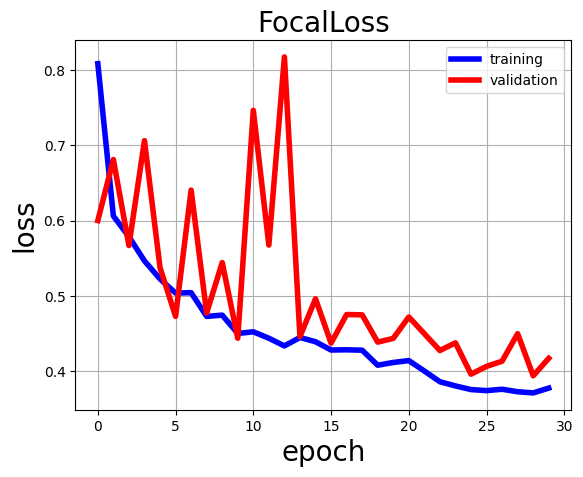

In [88]:
# plot loss
plot_losses = np.array(plot_losses)
plt.plot(plot_losses[:,0], plot_losses[:,1], color='b', linewidth=4)
plt.plot(plot_losses[:,0], plot_losses[:,2], color='r', linewidth=4)
plt.title('FocalLoss', fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('loss',fontsize=20)
plt.grid()
plt.legend(['training', 'validation']) # using a named size
plt.show()

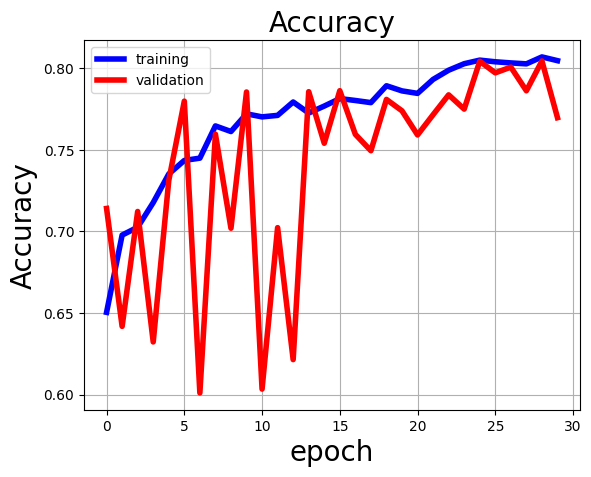

In [89]:
# plot accuracy
plot_validation = np.array(plot_validation)
plt.plot(plot_validation[:,0], plot_validation[:,1], color='b', linewidth=4)
plt.plot(plot_validation[:,0], plot_validation[:,2], color='r', linewidth=4)
plt.title('Accuracy', fontsize=20)
plt.xlabel('epoch',fontsize=20)
plt.ylabel('Accuracy',fontsize=20)
plt.grid()
plt.legend(['training', 'validation']) # using a named size
plt.show()

# testing

In [90]:
model.load_state_dict(torch.load('/content/saved_models/unet_epoch.pt'))

<All keys matched successfully>

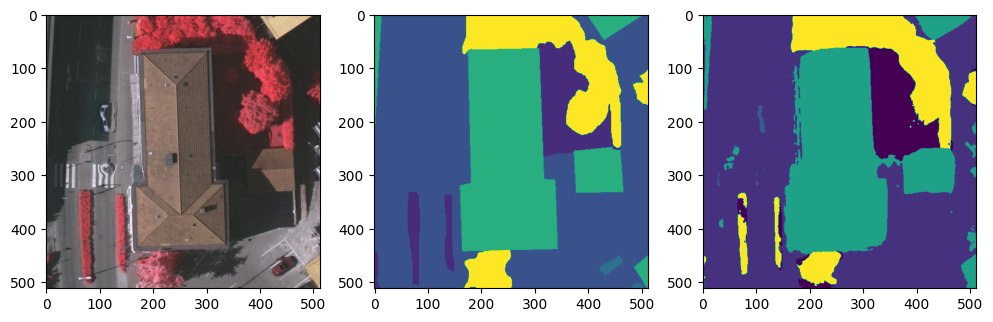

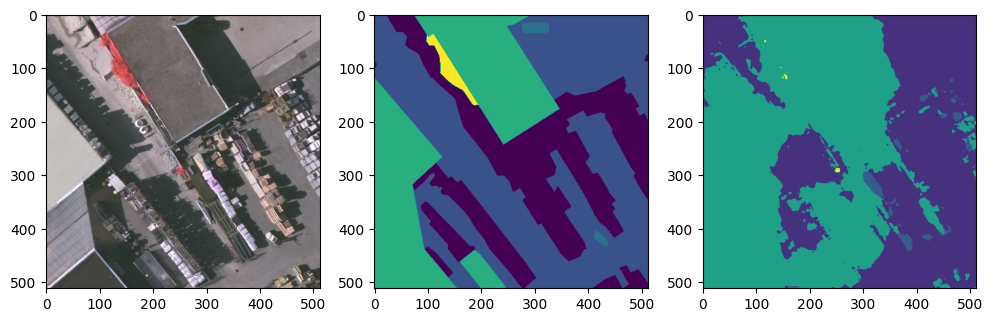

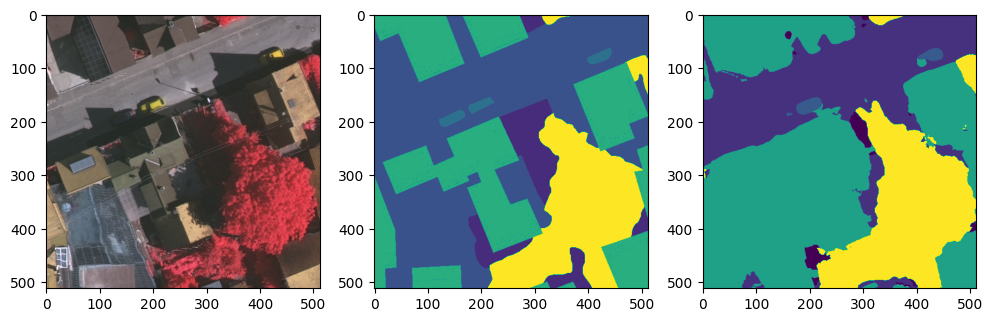

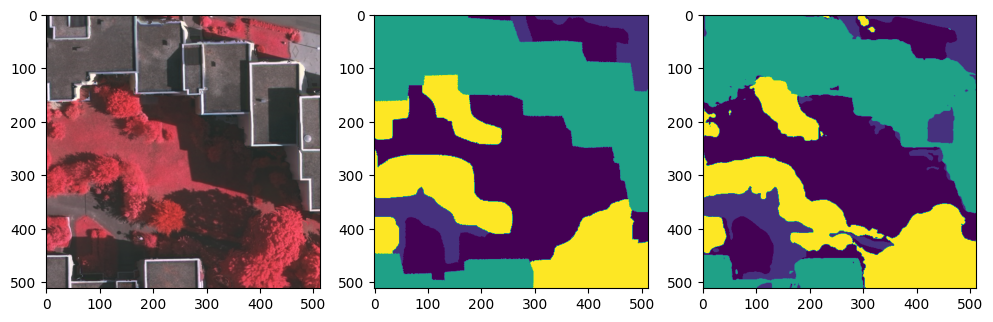

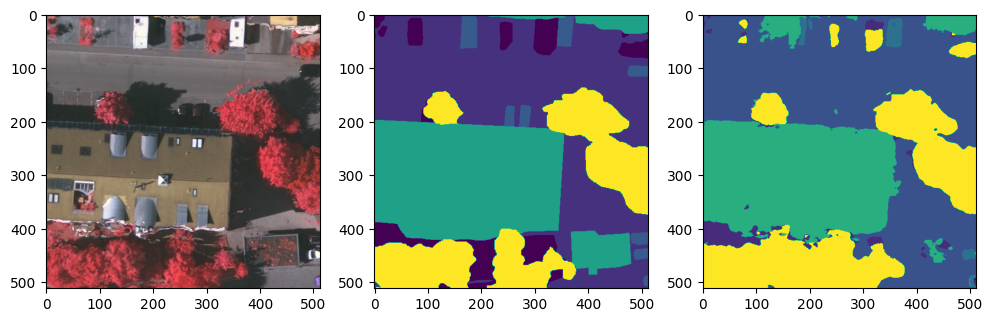

...

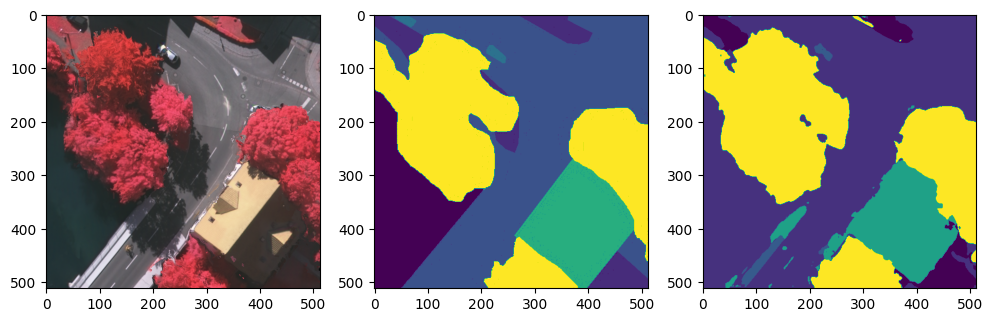

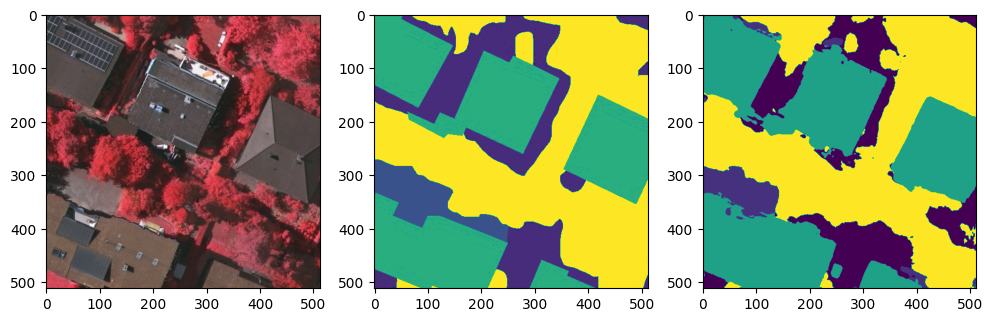

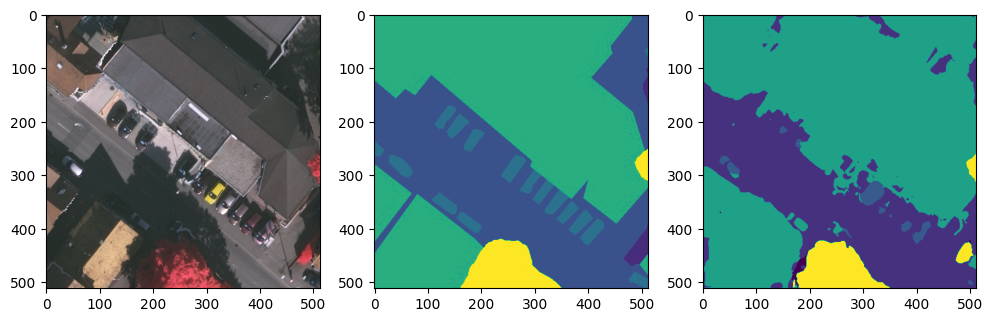

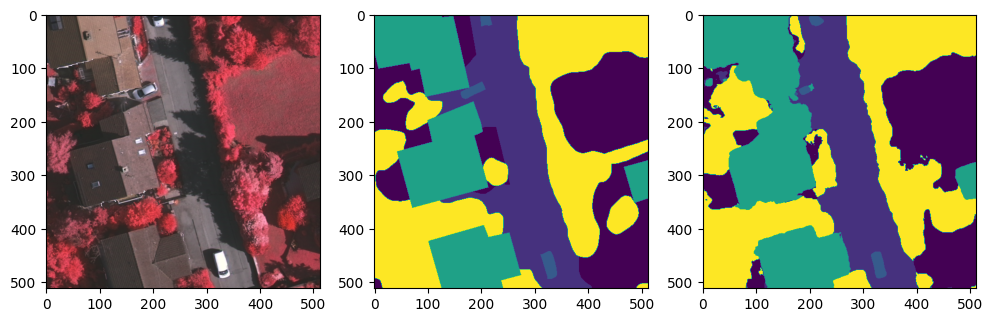

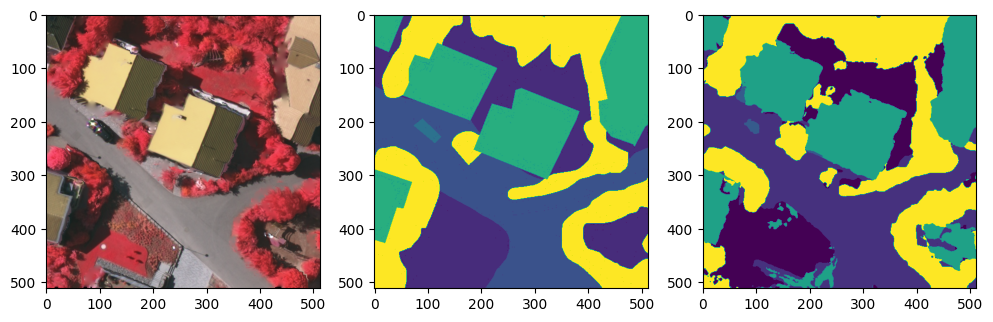

In [91]:
model.eval()

for batch_i, (x, y) in enumerate(test_dataloader):
    for j in range(len(x)):
        result = model(x.to(device)[j:j+1])
        mask = torch.argmax(result, axis=1).cpu().detach().numpy()[0]
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        gt_mask = y[j]

        plt.figure(figsize=(12,12))

        plt.subplot(1,3,1)
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        plt.imshow(im)

        plt.subplot(1,3,2)
        plt.imshow(gt_mask)

        plt.subplot(1,3,3)
        plt.imshow(mask)
        plt.show()

In [92]:
# !rm -r /content/saved_models

In [93]:
test = torch.rand(4,3,512,512).to(device)

In [94]:
model(test).shape

torch.Size([4, 9, 512, 512])

In [95]:
#test_img = cv2.imread('/content/00002.00345201.png')
#test_img = cv2.resize(test_img, (256,256))/255.0
#test_img = np.moveaxis(test_img, -1, 0).reshape(-1,3,256,256)
#test_img = torch.tensor(test_img).float()